# 4주차_데이터 탐색과 시각화 Ⅰ

- 공분산과 상관성 분석

---

In [10]:
# 필요한 패키지 설치

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
plt.rcParams['figure.dpi'] = 300

In [11]:
# 데이터 불러오기
# https://www.kaggle.com/datasets/deepakkumar1987/correlation
df = pd.read_csv("../../main/datasets/wine-quality.csv")

# 데이터 샘플 확인
df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [19]:
# pairplot은 seaborn 라이브러리에서 제공하는 매우 유용한 시각화 함수로, 
# 여러 변수 간의 관계(산점도)와 각 변수의 분포(히스토그램 또는 KDE)를 
# 한눈에 파악할 수 있게 도와주는 다변수 탐색적 데이터 분석(EDA) 도구

# 산점도 행렬 시각화
sns.set(font_scale=1.1)
# 시각화 전체의 글꼴 크기를 1.1배로 조정함
# 그래프 제목, 축 라벨, 범례 등의 가독성을 높이기 위한 설정임

sns.set_style('ticks')
# 그래프의 전반적인 스타일을 'ticks'(모서리에 작은 눈금 표시가 있는 스타일)로 설정함
# 논문 또는 리포트에 적합한 깔끔한 그래프 스타일을 제공함

sns.pairplot(df,
             diag_kind='kde'  # 상관계수가 1인 대각선 영역은 KDE(커널 밀도 추정) 그래프로 표현함
            )
# 데이터프레임(df)의 수치형 변수들 간의 산점도 행렬(pairplot)을 생성함
# 변수 간 관계를 시각적으로 확인할 수 있으며, 변수들 사이의 상관관계를 탐색하는 데 매우 유용함
# 대각선에는 각 변수의 분포를 KDE 그래프로, 나머지 셀에는 변수 간 산점도를 그려줌

plt.show()
# 생성된 모든 시각화 그래프를 출력함
# Jupyter 환경에서는 자동 출력되기도 하나, 명시적으로 작성하면 다양한 실행 환경에서 안정적으로 출력 가능함


In [13]:
# 공분산 확인
df.select_dtypes(float).cov()
# 데이터프레임에서 자료형이 float인 열들만 선택하여 이들 간의 공분산 행렬을 계산함
# 공분산은 두 변수 간의 선형적 관계 방향(같이 증가/감소하는 경향)을 수치로 표현한 통계량임
# 양의 공분산은 두 변수가 함께 증가하는 경향, 음의 공분산은 한 변수가 증가할 때 다른 변수가 감소하는 경향을 의미함
# 공분산은 단위에 민감하므로 크기 비교보다는 경향 파악에 적합함

# 📌 주의: 공분산은 변수의 스케일에 따라 값의 크기가 달라지므로, 변수 간 상관성의 "세기"보다는 방향성을 확인하는 데 사용
# 더 정확한 비교가 필요한 경우 df.corr()을 통해 **상관계수(correlation coefficient)**를 확인하는 것이 적절합

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
fixed acidity,1.681560,0.047012,0.060971,-0.693045,0.013564,-6.524162,-24.162531,0.001786,-0.052524,0.057990,-0.147911
volatile acidity,0.047012,0.027109,-0.009043,-0.154122,0.002177,-1.032411,-3.861743,0.000134,0.006898,0.005526,-0.007509
citric acid,0.060971,-0.009043,0.021102,0.098498,0.000200,0.344101,1.602662,0.000042,-0.007675,0.001245,-0.001808
residual sugar,-0.693045,-0.154122,0.098498,22.639751,-0.021493,34.060547,133.334227,0.007884,-0.204174,-0.131562,-2.041388
chlorides,0.013564,0.002177,0.000200,-0.021493,0.001228,-0.121269,-0.553673,0.000038,0.000252,0.002061,-0.010735
free sulfur dioxide,-6.524162,-1.032411,0.344101,34.060547,-0.121269,315.041192,723.261972,0.001369,-0.414329,-0.497973,-3.807165
total sulfur dioxide,-24.162531,-3.861743,1.602662,133.334227,-0.553673,723.261972,3194.720039,0.005491,-2.159577,-2.316258,-17.914646
density,0.001786,0.000134,0.000042,0.007884,0.000038,0.001369,0.005491,0.000009,0.000006,0.000116,-0.002456
pH,-0.052524,0.006898,-0.007675,-0.204174,0.000252,-0.414329,-2.159577,0.000006,0.025840,0.004575,0.023203
sulphates,0.057990,0.005526,0.001245,-0.131562,0.002061,-0.497973,-2.316258,0.000116,0.004575,0.022146,-0.000579


In [20]:
# 피어슨 상관계수 확인
df.select_dtypes(float).corr(method='pearson')
# 데이터프레임에서 float형 변수들만 선택하여 피어슨(Pearson) 방식으로 상관계수 행렬을 계산함
# 피어슨 상관계수는 두 변수 간의 선형 상관 관계의 강도와 방향을 [-1, 1] 범위의 수로 나타냄
# +1에 가까울수록 양의 강한 상관관계, -1에 가까울수록 음의 강한 상관관계, 0에 가까울수록 선형 관계가 거의 없음
# 변수 간 독립성 여부, 다중공선성 탐색, 변수 선택의 기초 근거로 활용 가능함

# 📌 상관계수 행렬은 heatmap()과 함께 사용하면 변수 간 관계를 시각적으로 직관화할 수 있음

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
fixed acidity,1.000000,0.220172,0.323736,-0.112319,0.298421,-0.283317,-0.329747,0.459204,-0.251814,0.300380,-0.095603
volatile acidity,0.220172,1.000000,-0.378061,-0.196702,0.377167,-0.353230,-0.414928,0.271193,0.260660,0.225476,-0.038248
citric acid,0.323736,-0.378061,1.000000,0.142486,0.039315,0.133437,0.195218,0.096320,-0.328689,0.057613,-0.010433
residual sugar,-0.112319,-0.196702,0.142486,1.000000,-0.128902,0.403439,0.495820,0.552498,-0.267050,-0.185745,-0.359706
chlorides,0.298421,0.377167,0.039315,-0.128902,1.000000,-0.195042,-0.279580,0.362594,0.044806,0.395332,-0.256861
free sulfur dioxide,-0.283317,-0.353230,0.133437,0.403439,-0.195042,1.000000,0.720934,0.025717,-0.145191,-0.188489,-0.179838
total sulfur dioxide,-0.329747,-0.414928,0.195218,0.495820,-0.279580,0.720934,1.000000,0.032395,-0.237687,-0.275381,-0.265740
density,0.459204,0.271193,0.096320,0.552498,0.362594,0.025717,0.032395,1.000000,0.011920,0.259454,-0.686745
pH,-0.251814,0.260660,-0.328689,-0.267050,0.044806,-0.145191,-0.237687,0.011920,1.000000,0.191248,0.121002
sulphates,0.300380,0.225476,0.057613,-0.185745,0.395332,-0.188489,-0.275381,0.259454,0.191248,1.000000,-0.003261


<Axes: >

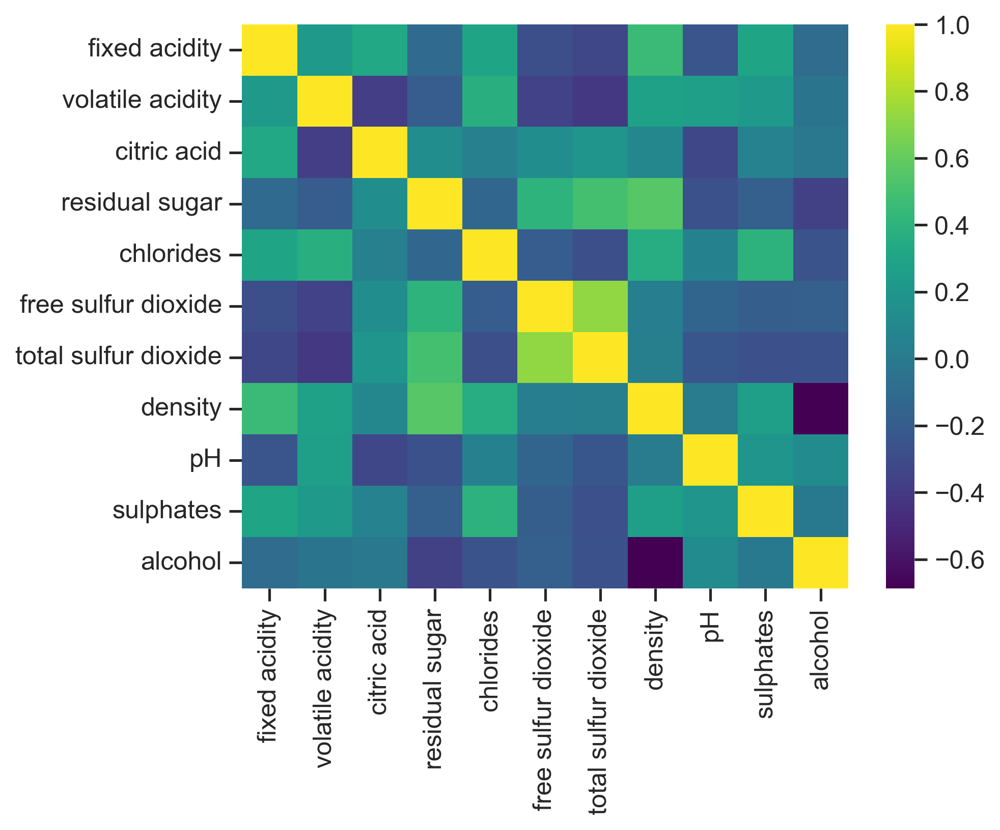

In [15]:
# 히트맵 시각화
sns.heatmap(df.select_dtypes(float).corr(), cmap='viridis')
# float형 변수들 간의 피어슨 상관계수 행렬을 seaborn의 heatmap 함수로 시각화함
# 각 변수쌍의 상관관계를 색상으로 표현하여, 관계의 강도와 방향을 직관적으로 파악할 수 있음
# cmap='viridis'는 색상 팔레트를 지정하는 옵션으로, 값이 작을수록 어둡고 클수록 밝은 색으로 표현됨
# 변수 간 양의 상관(밝은색), 음의 상관(어두운색)을 빠르게 식별할 수 있어 탐색적 데이터 분석에 효과적임


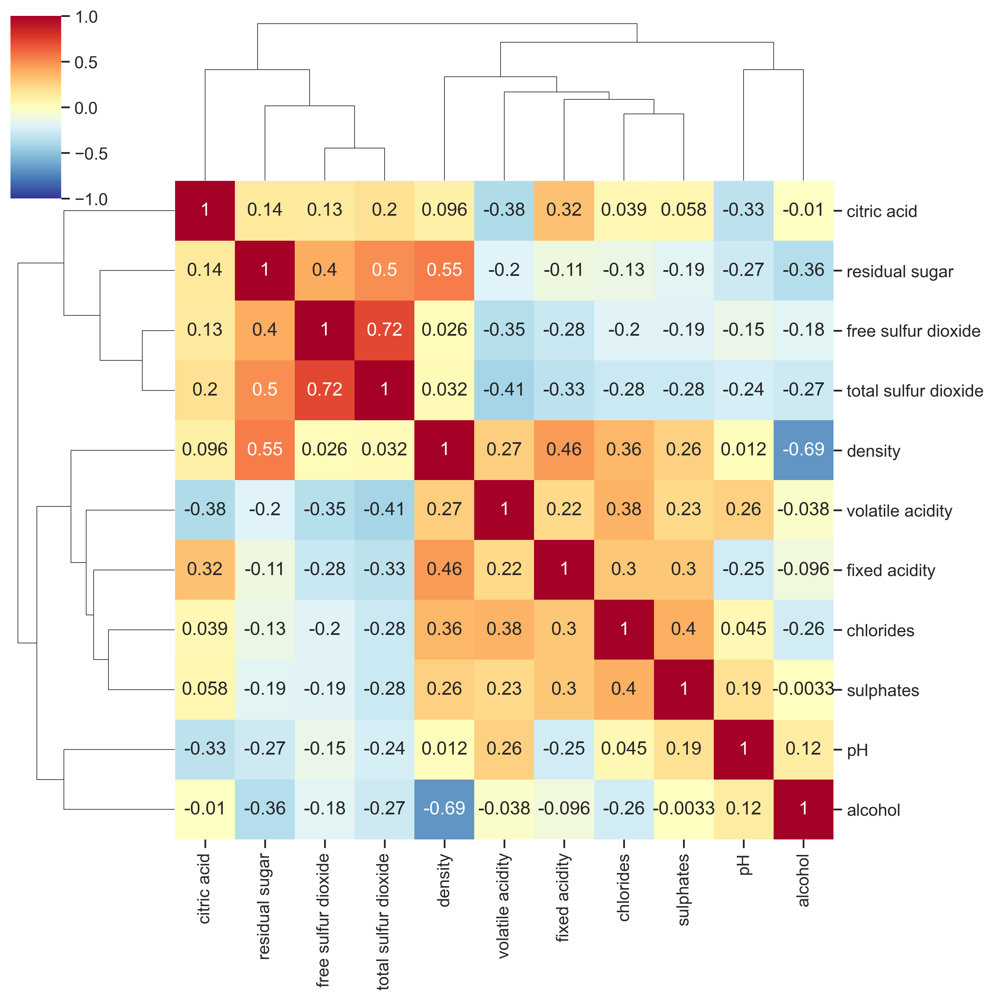

In [16]:
# clustermap 히트맵 시각화
sns.clustermap(df.select_dtypes(float).corr(), 
               annot = True,      
               cmap = 'RdYlBu_r',  
               vmin = -1, vmax = 1,
              )
# 수치형 변수 간 상관계수 행렬을 기반으로 seaborn의 clustermap을 이용해 히트맵을 시각화함
# 변수 간 상관관계를 기준으로 계층적 클러스터링을 수행하고, 유사한 변수끼리 묶어 시각화함
# annot=True 옵션은 각 셀에 상관계수 값을 숫자로 표시함
# cmap='RdYlBu_r'는 빨강(음의 상관), 노랑(0 근처), 파랑(양의 상관)으로 표현되는 컬러맵을 뒤집은 버전임
# vmin, vmax는 색상 맵의 범위를 -1~1로 고정하여 시각적으로 일관된 비교를 가능하게 함
# 단순한 heatmap과 달리 변수 간 구조적 유사성을 탐색할 수 있어, 변수 선택 및 차원 축소 전 사전 탐색에 유용함

Text(0.5, 1.0, 'Feature Correlation (Upper Triangle Masked)')

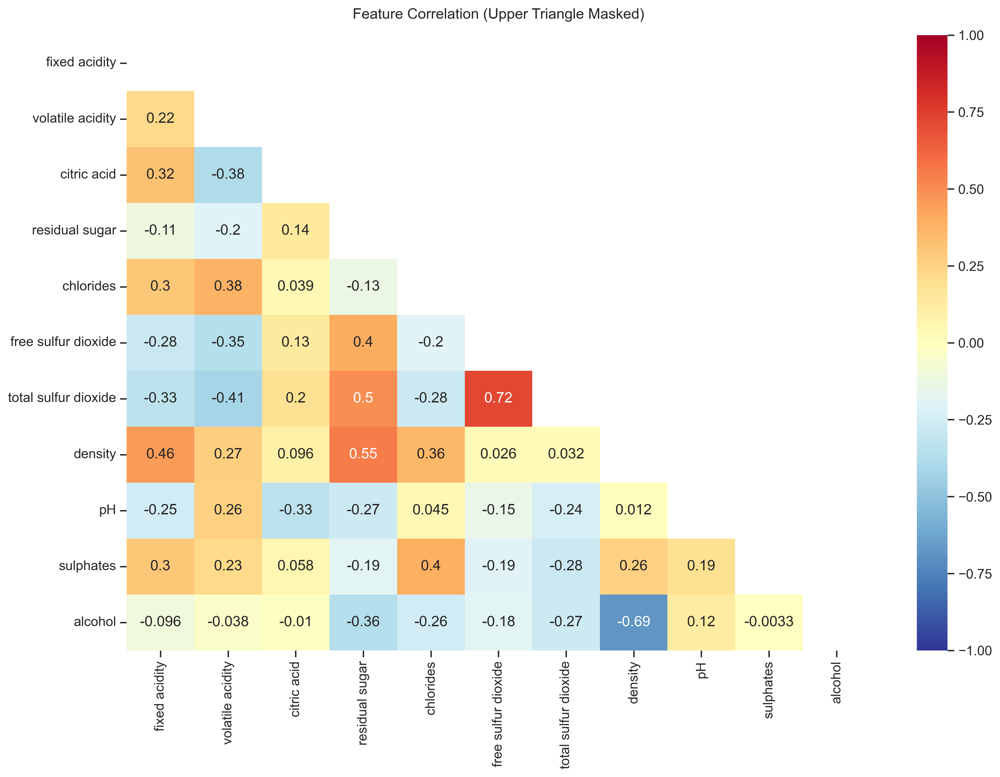

In [21]:
# 중복 제거 히트맵 시각화

# 상단 삼각형 마스크 생성
mask = np.triu(np.ones_like(df.select_dtypes(float).corr(), dtype=bool))
# 상관계수 행렬과 같은 크기의 1로 채워진 배열을 생성한 뒤, 상단 삼각형 부분만 True로 마스킹함
# dtype=bool로 설정하여 마스크 배열을 불리언 형태로 생성함
# 히트맵에서 대칭 구조의 중복을 제거하고, 하단 삼각 영역만 시각화하기 위한 준비 작업임

# 히트맵 그래프 생성
fig, ax = plt.subplots(figsize=(15, 10))
# matplotlib의 figure 및 axes 객체를 생성하고, 그래프 크기를 15x10인치로 지정함
# 크기를 조정함으로써 출력 결과의 가독성을 확보함

sns.heatmap(df.select_dtypes(float).corr(), 
            mask=mask, 
            vmin=-1, 
            vmax=1, 
            annot=True, 
            cmap="RdYlBu_r", 
            cbar=True)
# float형 변수 간의 피어슨 상관계수 행렬을 히트맵으로 시각화함
# mask=mask 옵션을 통해 상단 삼각형 영역을 숨기고 중복을 제거함
# vmin/vmax는 컬러맵 스케일 범위를 -1~1로 고정하여 상관계수 비교를 일관되게 유지함
# annot=True는 각 셀에 상관계수 값을 직접 표시함
# cmap="RdYlBu_r"은 음수(빨강), 0(노랑), 양수(파랑)로 구분되는 컬러맵을 뒤집어 적용함
# cbar=True는 우측에 컬러 바를 표시하여 색상과 수치 간 관계를 명확히 안내함

ax.set_title('Feature Correlation (Upper Triangle Masked)', pad=15)
# 그래프 상단에 제목을 설정하고, pad=15를 통해 제목과 그래프 간 간격을 조정함